I will load all eGRN chunks for Zhu et al data, which aggregatedly contain all genes\
for which Pando could fit eGRN models.

In [1]:
getwd()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2023_Zhu_et_al/Zhu_et_al_2023/24_09_24"

In [2]:
here::here()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2023_Zhu_et_al/Zhu_et_al_2023/24_09_24"

####### load the R environment with the necessary packages such as Epiregulon:

my_epiregulon_lib <- "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2024_C_A_Zhu_C_et_al/04_02_25/renv/library/linux-rhel-9.4/R-4.4/x86_64-unknown-linux-gnu"


In [4]:
.libPaths(new = my_epiregulon_lib, include.site = FALSE)

In [5]:
.libPaths()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2024_C_A_Mannens_C_et_al/04_02_25/renv/library/linux-rhel-9.4/R-4.4/x86_64-unknown-linux-gnu"
[2] "/gnu/store/29x2k7i71g9xq09xmbj1lk515cl7if63-r-minimal-4.4.2/lib/R/library"

In [6]:
library(magrittr)

In [14]:
here::here('r_objects') %>% list.dirs() %>% list.files() %>% grep(pattern = 'SLURM', value = TRUE) %>% gtools::mixedsort() %>% print()

 [1] "Zhu_et_al_Pando_w_eGRNs_SLURM_c1.RDS"
 [2] "Zhu_et_al_Pando_w_eGRNs_SLURM_c2.RDS"
 [3] "Zhu_et_al_Pando_w_eGRNs_SLURM_c3.RDS"
 [4] "Zhu_et_al_Pando_w_eGRNs_SLURM_c4.RDS"
 [5] "Zhu_et_al_Pando_w_eGRNs_SLURM_c5.RDS"
 [6] "Zhu_et_al_Pando_w_eGRNs_SLURM_c6.RDS"
 [7] "Zhu_et_al_w_eGRNs_SLURM_c1.RDS"      
 [8] "Zhu_et_al_w_eGRNs_SLURM_c2.RDS"      
 [9] "Zhu_et_al_w_eGRNs_SLURM_c3.RDS"      
[10] "Zhu_et_al_w_eGRNs_SLURM_c4.RDS"      
[11] "Zhu_et_al_w_eGRNs_SLURM_c5.RDS"      
[12] "Zhu_et_al_w_eGRNs_SLURM_c6.RDS"      
[13] "Zhu_et_al_w_eGRNs_SLURM_c7.RDS"      
[14] "Zhu_et_al_w_eGRNs_SLURM_c8.RDS"      
[15] "Zhu_et_al_w_eGRNs_SLURM_c9.RDS"      
[16] "Zhu_et_al_w_eGRNs_SLURM_c10.RDS"     
[17] "Zhu_et_al_w_eGRNs_SLURM_c11.RDS"     
[18] "Zhu_et_al_w_eGRNs_SLURM_c12.RDS"     
[19] "Zhu_et_al_w_eGRNs_SLURM_c13.RDS"     
[20] "Zhu_et_al_w_eGRNs_SLURM_c14.RDS"     
[21] "Zhu_et_al_w_eGRNs_SLURM_c15.RDS"     
[22] "Zhu_et_al_w_eGRNs_SLURM_c16.RDS"     
[23] "Zhu_et_al_w_eGRNs_SLURM_c1

In [89]:
# Except four of the eGRN objects, all contains some number of overlapping genes.

# I will compare the coefficients and number of variables predicted for those 
# overlapping genes in the combined Pando eGRN object.

===================================================================================================

I used the following commands in a tmux session to combine coefficient data.frames, fit data.frames\
and features vectors from all eGRN objects:

In [21]:
# getwd()

# here::here()

# # load the R environment with the necessary packages such as Epiregulon:

# my_epiregulon_lib <- "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2024_C_A_Zhu_C_et_al/04_02_25/renv/library/linux-rhel-9.4/R-4.4/x86_64-unknown-linux-gnu"

# .libPaths(new = my_epiregulon_lib, include.site = FALSE)

# .libPaths()

# library(magrittr)

# here::here('r_objects') |> list.dirs() %>% basename()

# # view eGRN objects in windows-style order:

# here::here('r_objects', 'pando_eGRN_chunks_final') |> list.files() %>% gtools::mixedsort() %>% print()

# library(tidyverse)

# library(Seurat)

# library(Signac)

# library(Pando)

# # Import first eGRN object to access Seurat object:

# Zhu_et_al_Pando_w_eGRNs_SLURM_c1 <- 
#     readRDS(here::here('r_objects', 'pando_eGRN_chunks_final', 'Zhu_et_al_w_eGRNs_SLURM_c1.RDS'))

# coef_DF <- coef(Zhu_et_al_Pando_w_eGRNs_SLURM_c1) 

# fit_DF <-  Zhu_et_al_Pando_w_eGRNs_SLURM_c1@grn@networks$glm_network@fit

# coef_DF %>% head()

# fit_DF %>% head()

# features_vector <- NetworkFeatures(Zhu_et_al_Pando_w_eGRNs_SLURM_c1)

# file_prefix <- "Zhu_et_al_w_eGRNs_SLURM_c"

# for(i in c(2:61)) {

#  message(glue::glue("reading chunk ",{i}))
    
#  chunk_obj <- readRDS(here::here('r_objects', 'pando_eGRN_chunks_final', paste0(file_prefix, i, ".RDS")))

#  coef_DF <- rbind(coef_DF, coef(chunk_obj))

#  fit_DF <- rbind(fit_DF, chunk_obj@grn@networks$glm_network@fit)

#  features_vector <- c(features_vector, NetworkFeatures(chunk_obj))

#  rm(chunk_obj)
                      
#  message(glue::glue("added chunk ",{i}))

# }    

# coef_DF %>% saveRDS(here::here('r_objects', 'coef_DF_combined.RDS'))

# fit_DF %>% saveRDS(here::here('r_objects', 'fit_DF_combined.RDS'))

# features_vector %>% saveRDS(here::here('r_objects', 'features_vector_combined.RDS'))

# ## end ##

In [22]:
library(magrittr)

In [23]:
here::here('r_objects') |> list.dirs() %>% basename()

[1] "r_objects"               ".ipynb_checkpoints"     
[3] "pando_eGRN_chunks_final"

In [24]:
library(tidyverse)

-- Attaching core tidyverse packages ------------------------ tidyverse 2.0.0 --
v dplyr     1.1.4     v readr     2.1.5
v forcats   1.0.0     v stringr   1.5.1
v ggplot2   3.5.1     v tibble    3.2.1
v lubridate 1.9.3     v tidyr     1.3.1
v purrr     1.0.4     
-- Conflicts ------------------------------------------ tidyverse_conflicts() --
x tidyr::extract()   masks magrittr::extract()
x dplyr::filter()    masks stats::filter()
x dplyr::lag()       masks stats::lag()
x purrr::set_names() masks magrittr::set_names()
i Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


In [25]:
library(Seurat)

Loading required package: SeuratObject

Loading required package: sp

'SeuratObject' was built under R 4.4.1 but the current version is
4.4.2; it is recomended that you reinstall 'SeuratObject' as the ABI
for R may have changed


Attaching package: 'SeuratObject'


The following objects are masked from 'package:base':

    intersect, t




In [26]:
library(Signac)

In [27]:
library(Pando)


Attaching package: 'Pando'


The following objects are masked from 'package:Seurat':

    GetAssay, VariableFeatures


The following objects are masked from 'package:SeuratObject':

    LayerData, VariableFeatures




In [28]:
coef_DF <- readRDS(here::here('r_objects', 'coef_DF_combined.RDS'))

In [29]:
fit_DF <- readRDS(here::here('r_objects', 'fit_DF_combined.RDS'))

In [30]:
features_vector <- readRDS(here::here('r_objects', 'features_vector_combined.RDS'))

In [31]:
features_vector %>% duplicated() %>% table()

.
FALSE  TRUE 
18285   178 

In [32]:
fit_DF %>% head()

target,rsq,nvariables
<chr>,<dbl>,<dbl>
HES4,0.0521901649,86
ISG15,0.0328600606,45
AGRN,0.0134333350,16
ACAP3,0.0002518949,1
VWA1,0.0071258028,3
TMEM240,0.0003977662,2


In [33]:
fit_DF %>% pull(target) %>% duplicated() %>% table()

.
FALSE  TRUE 
 7112    67 

In [34]:
fit_DF %>% filter(target %in% target[duplicated(target)]) %>% arrange(target) %>% print(n = Inf)

# A tibble: 134 x 3
    target            rsq nvariables
    <chr>           <dbl>      <dbl>
  1 AC010983.1 0.0107              5
  2 AC010983.1 0.00490             2
  3 ADGRA1     0.0193             35
  4 ADGRA1     0.0285             95
  5 AHDC1      0.000193            3
  6 AHDC1      0.00277            13
  7 ARHGAP9    0.0259             86
  8 ARHGAP9    0.0531            206
  9 BEAN1      0.00466            13
 10 BEAN1      0.00357            13
 11 CCSER2     0.000448            8
 12 CCSER2     0.00139             9
 13 CFAP46     0.0160             26
 14 CFAP46     0.0284            107
 15 CHL1       0.0933            374
 16 CHL1       0.0731            227
 17 CRHBP      0.0163             26
 18 CRHBP      0.00869            12
 19 DCUN1D1    0.0333            164
 20 DCUN1D1    0.0258             88
 21 DDR2       0.0765            381
 22 DDR2       0.0892            491
 23 EXOC2      0.00284            11
 24 EXOC2      0.00143             5
 25 F2R        0.0

In [35]:
# Keep those with better rsq values.

In [36]:
coef_DF %>% filter(target %in% "ABCA5")

tf,target,region,term,estimate,std_err,statistic,pval,padj,corr
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
BCL11A,ABCA5,chr17-68772182-68772399,chr17_68772182_68772399:BCL11A,0.0427514650,0.006874917,6.2184696,5.063901e-10,1.227830e-08,0.1136604
PRDM16,ABCA5,chr17-68777241-68777938,chr17_68777241_68777938:PRDM16,-0.0351679116,0.011431265,-3.0764671,2.095940e-03,1.349289e-02,-0.1418698
SOX11,ABCA5,chr17-68777241-68777938,chr17_68777241_68777938:SOX11,-0.0307616714,0.008435795,-3.6465644,2.660669e-04,2.286442e-03,-0.1031512
BCL11A,ABCA5,chr17-68777241-68777938,BCL11A:chr17_68777241_68777938,0.0512799821,0.008215634,6.2417559,4.365017e-10,1.063958e-08,0.1136604
STAT4,ABCA5,chr17-68777241-68777938,chr17_68777241_68777938:STAT4,0.0540855596,0.020314507,2.6624107,7.761051e-03,3.957857e-02,0.1181782
FOXO1,ABCA5,chr17-68777241-68777938,chr17_68777241_68777938:FOXO1,-0.0085946434,0.005991150,-1.4345566,1.514204e-01,3.565808e-01,-0.1010922
THRB,ABCA5,chr17-68778082-68778184,chr17_68778082_68778184:THRB,0.0106015750,0.004329392,2.4487444,1.433927e-02,6.379300e-02,0.1479464
TRPS1,ABCA5,chr17-68778082-68778184,chr17_68778082_68778184:TRPS1,-0.0010734795,0.004092476,-0.2623056,7.930870e-01,9.046536e-01,-0.1531976
PRDM16,ABCA5,chr17-68778603-68778710,PRDM16:chr17_68778603_68778710,-0.0456452186,0.017251757,-2.6458302,8.151881e-03,4.107285e-02,-0.1418698


In [37]:
coef_DF$region %>% lapply(length) %>% unlist() %>% table()

.
     1 
981997 

In [38]:
coef_DF$region %>% length()

[1] 981997

In [39]:
coef_DF %>% select(tf, target, region) %>% duplicated() %>% table()

.
 FALSE   TRUE 
976240   5757 

In [40]:
coef_DF %>% select(tf, target, region) %>% duplicated() %>% head()

[1] FALSE FALSE FALSE FALSE FALSE FALSE

In [41]:
coef_DF %>%
  filter(duplicated(select(., tf, target, region))) %>%
  pull(tf) %>%
  unique() %>%
  length()

[1] 270

In [42]:
coef_DF %>%
  filter(duplicated(select(., tf, target, region))) %>%
  pull(target) %>%
  unique() %>%
  length()

[1] 63

I added each chunk's coef df using rbind function.\
Same also for fit dfs. I also concatanated the features\
vectors in the same order.

Now, I will keep the first occurences of the duplicate tf-target\
connections so that the fisrt chunk's data will be used for each\
consecutive chunks' overlapping target genes.

In [43]:
coef_DF_deduplicated <- 
                coef_DF %>%
                      filter(!duplicated(select(., tf, target, region)))

In [44]:
fit_DF_deduplicated <- 
                fit_DF %>% filter(!duplicated(select(., target)))

In [45]:
features_vector_deduplicated <- 
                features_vector[!duplicated(features_vector)]

In [46]:
# check that fit df should contain only unique target genes:

Zhu_et_al_w_eGRNs_SLURM_c1 <- 
    readRDS(here::here('r_objects', 'pando_eGRN_chunks_final', 'Zhu_et_al_w_eGRNs_SLURM_c1.RDS'))

In [47]:
Zhu_et_al_w_eGRNs_SLURM_c1

An object of class "GRNData"
Slot "grn":
A RegulatoryNetwork object based on 1014 transcription factors

1 inferred network: glm_network

Slot "data":
An object of class Seurat 
364381 features across 45549 samples within 3 assays 
Active assay: SCT (30146 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: RNA, peaks
 7 dimensional reductions calculated: pca, umap.rna, lsi, umap.atac, wnn.umap, pca.harmony, lsi.harmony


In [48]:
Zhu_et_al_w_eGRNs_SLURM_c1@grn@networks$glm_network@fit %>% pull(target) %>% duplicated() %>% table()

.
FALSE 
   98 

In [33]:
# So they are unique. 
# Now I will create a new combined network object:

In [49]:
Zhu_et_al_w_eGRNs_SLURM_c1@grn@networks$glm_network@coefs %>% pull(target) %>% unique() %>% length()

[1] 97

In [50]:
Zhu_et_al_w_eGRNs_SLURM_c1 %>% NetworkFeatures() %>% length()

[1] 334

In [51]:
coef_DF_deduplicated %>% dim()

[1] 976240     10

In [52]:
fit_DF_deduplicated %>% dim()

[1] 7112    3

In [53]:
fit_DF_deduplicated$target %>% duplicated() %>% table()

.
FALSE 
 7112 

In [54]:
coef_DF_deduplicated$target %>% unique() %>% length()

[1] 7074

In [55]:
features_vector_deduplicated %>% length()

[1] 18285

In [56]:
setdiff(fit_DF_deduplicated$target, unique(coef_DF_deduplicated$target)) %>% { filter(fit_DF_deduplicated, target %in% .) }

target,rsq,nvariables
<chr>,<dbl>,<dbl>
TP73,0,2
RORC,0,2
SPTA1,0,10
MYL1,0,5
ESPNL,0,2
LINC00879,0,1
AGTR1,0,1
LINC00881,0,2
LINC01327,0,2


In [57]:
setdiff(fit_DF_deduplicated$target, unique(coef_DF_deduplicated$target)) %>% { filter(fit_DF_deduplicated, target %in% .) } %>% summary()

    target               rsq      nvariables    
 Length:38          Min.   :0   Min.   : 1.000  
 Class :character   1st Qu.:0   1st Qu.: 1.000  
 Mode  :character   Median :0   Median : 1.500  
                    Mean   :0   Mean   : 2.079  
                    3rd Qu.:0   3rd Qu.: 2.000  
                    Max.   :0   Max.   :10.000  

In [58]:
find_modules

function (object, ...) 
{
    UseMethod(generic = "find_modules", object = object)
}
<bytecode: 0x1d281700>
<environment: namespace:Pando>

In [59]:
methods("find_modules")

[1] find_modules.GRNData* find_modules.Network*
see '?methods' for accessing help and source code

In [60]:
getS3method("find_modules", "Network") 

function (object, p_thresh = 0.05, rsq_thresh = 0.1, nvar_thresh = 10, 
    min_genes_per_module = 5, xgb_method = c("tf", "target"), 
    xgb_top = 50, verbose = TRUE) 
{
    fit_method <- NetworkParams(object)$method
    xgb_method <- match.arg(xgb_method)
    if (!fit_method %in% c("glm", "cv.glmnet", "glmnet", "brms", 
        "xgb")) {
        stop(paste0("find_modules() is not yet implemented for \"", 
            fit_method, "\" models"))
    }
    models_use <- gof(object) %>% filter(rsq > rsq_thresh & nvariables > 
        nvar_thresh) %>% pull(target) %>% unique()
    modules <- coef(object) %>% filter(target %in% models_use)
    if (fit_method %in% c("cv.glmnet", "glmnet")) {
        modules <- modules %>% filter(estimate != 0)
    }
    else if (fit_method == "xgb") {
        modules <- modules %>% group_by_at(xgb_method) %>% top_n(xgb_top, 
            gain) %>% mutate(estimate = sign(corr) * gain)
    }
    else {
        modules <- modules %>% filter(ifelse(is.na(padj), T, 
            padj < p_thresh))
    }
    modules <- modules %>% group_by(target) %>% mutate(nvars = n()) %>% 
        group_by(target, tf) %>% mutate(tf_sites_per_gene = n()) %>% 
        group_by(target) %>% mutate(tf_per_gene = length(unique(tf)), 
        peak_per_gene = length(unique(region))) %>% group_by(tf) %>% 
        mutate(gene_per_tf = length(unique(target))) %>% group_by(target, 
        tf)
    if (fit_method %in% c("cv.glmnet", "glmnet", "xgb")) {
        modules <- modules %>% reframe(estimate = sum(estimate), 
            n_regions = peak_per_gene, n_genes = gene_per_tf, 
            n_tfs = tf_per_gene, regions = paste(region, collapse = ";"))
    }
    else {
        modules <- modules %>% reframe(estimate = sum(estimate), 
            n_regions = peak_per_gene, n_genes = gene_per_tf, 
            n_tfs = tf_per_gene, regions = paste(region, collapse = ";"), 
            pval = min(pval), padj = min(padj))
    }
    modules <- modules %>% distinct() %>% arrange(tf)
    module_pos <- modules %>% filter(estimate > 0) %>% group_by(tf) %>% 
        filter(n() > min_genes_per_module) %>% group_split() %>% 
        {
            names(.) <- map_chr(., function(x) x$tf[[1]])
            .
        } %>% map(function(x) x$target)
    module_neg <- modules %>% filter(estimate < 0) %>% group_by(tf) %>% 
        filter(n() > min_genes_per_module) %>% group_split() %>% 
        {
            names(.) <- map_chr(., function(x) x$tf[[1]])
            .
        } %>% map(function(x) x$target)
    regions_pos <- modules %>% filter(estimate > 0) %>% group_by(tf) %>% 
        filter(n() > min_genes_per_module) %>% group_split() %>% 
        {
            names(.) <- map_chr(., function(x) x$tf[[1]])
            .
        } %>% map(function(x) unlist(str_split(x$regions, ";")))
    regions_neg <- modules %>% filter(estimate < 0) %>% group_by(tf) %>% 
        filter(n() > min_genes_per_module) %>% group_split() %>% 
        {
            names(.) <- map_chr(., function(x) x$tf[[1]])
            .
        } %>% map(function(x) unlist(str_split(x$regions, ";")))
    module_feats <- list(genes_pos = module_pos, genes_neg = module_neg, 
        regions_pos = regions_pos, regions_neg = regions_neg)
    log_message(paste0("Found ", length(unique(modules$tf)), 
        " TF modules"), verbose = verbose)
    module_meta <- select(modules, tf, target, everything())
    object@modules@meta <- module_meta
    object@modules@features <- module_feats
    object@modules@params <- list(p_thresh = p_thresh, rsq_thresh = rsq_thresh, 
        nvar_thresh = nvar_thresh, min_genes_per_module = min_genes_per_module)
    return(object)
}
<bytecode: 0x23c591d8>
<environment: namespace:Pando>

In [61]:
coef_DF %>% head()

tf,target,region,term,estimate,std_err,statistic,pval,padj,corr
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
EBF1,HES4,chr1-181323-181566,chr1_181323_181566:EBF1,-0.005490080,0.006760677,-0.8120608,4.167610e-01,6.222333e-01,0.1972208
SOX5,HES4,chr1-190865-191071,chr1_190865_191071:SOX5,-0.004173577,0.001232108,-3.3873468,7.063190e-04,4.366374e-03,0.1104385
PLAGL1,HES4,chr1-1000173-1000409,chr1_1000173_1000409:PLAGL1,0.035287188,0.004157578,8.4874383,2.175194e-17,8.842600e-16,0.1090396
HES5,HES4,chr1-1000719-1001023,chr1_1000719_1001023:HES5,0.039991790,0.005042564,7.9308447,2.225943e-15,8.022078e-14,0.1268518
HEYL,HES4,chr1-1000719-1001023,chr1_1000719_1001023:HEYL,0.168144179,0.018279397,9.1985627,3.776631e-20,1.768751e-18,0.1335675
ID2,HES4,chr1-1000719-1001023,chr1_1000719_1001023:ID2,0.017716548,0.004403321,4.0234512,5.744415e-05,4.840836e-04,0.1031612


In [62]:
coef_DF %>% distinct(tf, target, region, .keep_all = TRUE) %>% dim()

[1] 976240     10

In [63]:
coef_DF %>% distinct(tf, target, region, .keep_all = TRUE) %>% pull(target) %>% unique() %>% length()

[1] 7074

In [64]:
identical(coef_DF_deduplicated, coef_DF %>% distinct(tf, target, region, .keep_all = TRUE))

[1] TRUE

In [65]:
# Import the last eGRN object to test this:

Zhu_et_al_w_eGRNs_SLURM_c61 <- 
    readRDS(here::here('r_objects', 'pando_eGRN_chunks_final', 'Zhu_et_al_w_eGRNs_SLURM_c61.RDS'))

In [66]:
Zhu_et_al_w_eGRNs_SLURM_c61@grn@networks$glm_network@fit %>% pull(target) %>% duplicated() %>% table()

.
FALSE 
  100 

In [67]:
Zhu_et_al_w_eGRNs_SLURM_c61@grn@networks$glm_network@coefs %>% pull(target) %>% unique() %>% length()

[1] 100

In [68]:
Zhu_et_al_w_eGRNs_SLURM_c61 %>% NetworkFeatures() %>% length()

[1] 323

In [71]:
Zhu_et_al_w_eGRNs_SLURM_c61@grn@networks$glm_network@fit %>% pull(target) %>% setdiff(unique(coef(Zhu_et_al_w_eGRNs_SLURM_c61)$target)) %>% dput()

character(0)


======================================================================

IMPORTANT NOTE:

In a Pando eGRN object, Features contain all target genes for which annottaion info\
exists in the Annotation onject of the inputted chromatin assay.

Fit data.frame contains the target genes that are the fragment of Features that Pando could fit a model.

"coef" data.frame contains informative metrics for only those target genes in the\
"fit" data.frame with non-zero "rsq" values.

So one should expect that most of the times the length of :

input_genes > Features > fit$target > unique(coef's target)

=======================================================================

In [74]:
# Create a new Pando Object:

Zhu_et_al_w_JOINT_eGRNs <- Zhu_et_al_w_eGRNs_SLURM_c1

In [75]:
Zhu_et_al_w_JOINT_eGRNs@grn@networks$glm_network@fit <- fit_DF_deduplicated

In [76]:
Zhu_et_al_w_JOINT_eGRNs@grn@networks$glm_network@coefs <- coef_DF_deduplicated

In [77]:
Zhu_et_al_w_JOINT_eGRNs@grn@networks$glm_network@features  <- features_vector_deduplicated

In [78]:
Zhu_et_al_w_JOINT_eGRNs

An object of class "GRNData"
Slot "grn":
A RegulatoryNetwork object based on 1014 transcription factors

1 inferred network: glm_network

Slot "data":
An object of class Seurat 
364381 features across 45549 samples within 3 assays 
Active assay: SCT (30146 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: RNA, peaks
 7 dimensional reductions calculated: pca, umap.rna, lsi, umap.atac, wnn.umap, pca.harmony, lsi.harmony


In [79]:
Zhu_et_al_w_JOINT_eGRNs %>% NetworkFeatures() %>% length()

[1] 18285

In [80]:
Zhu_et_al_w_JOINT_eGRNs %>% coef() %>% dim()

[1] 976240     10

In [81]:
Zhu_et_al_w_JOINT_eGRNs@grn@networks$glm_network@fit %>% head()

target,rsq,nvariables
<chr>,<dbl>,<dbl>
HES4,0.0521901649,86
ISG15,0.0328600606,45
AGRN,0.0134333350,16
ACAP3,0.0002518949,1
VWA1,0.0071258028,3
TMEM240,0.0003977662,2


In [82]:
Zhu_et_al_w_JOINT_eGRNs@grn@networks$glm_network@fit %>% dim()

[1] 7112    3

In [83]:
Zhu_et_al_w_JOINT_eGRNs@grn@regions

An Regions object
with 449191 candidate genomic regions in 226735 peaks

In [84]:
Zhu_et_al_w_eGRNs_SLURM_c1@grn@regions

An Regions object
with 449191 candidate genomic regions in 226735 peaks

In [86]:
Zhu_et_al_w_eGRNs_SLURM_c61@grn@regions

An Regions object
with 449191 candidate genomic regions in 226735 peaks

In [87]:
Zhu_et_al_w_eGRNs_SLURM_c1

An object of class "GRNData"
Slot "grn":
A RegulatoryNetwork object based on 1014 transcription factors

1 inferred network: glm_network

Slot "data":
An object of class Seurat 
364381 features across 45549 samples within 3 assays 
Active assay: SCT (30146 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: RNA, peaks
 7 dimensional reductions calculated: pca, umap.rna, lsi, umap.atac, wnn.umap, pca.harmony, lsi.harmony


In [88]:
Zhu_et_al_w_eGRNs_SLURM_c61

An object of class "GRNData"
Slot "grn":
A RegulatoryNetwork object based on 1014 transcription factors

1 inferred network: glm_network

Slot "data":
An object of class Seurat 
364381 features across 45549 samples within 3 assays 
Active assay: SCT (30146 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: RNA, peaks
 7 dimensional reductions calculated: pca, umap.rna, lsi, umap.atac, wnn.umap, pca.harmony, lsi.harmony


In [89]:
Zhu_et_al_w_JOINT_eGRNs

An object of class "GRNData"
Slot "grn":
A RegulatoryNetwork object based on 1014 transcription factors

1 inferred network: glm_network

Slot "data":
An object of class Seurat 
364381 features across 45549 samples within 3 assays 
Active assay: SCT (30146 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: RNA, peaks
 7 dimensional reductions calculated: pca, umap.rna, lsi, umap.atac, wnn.umap, pca.harmony, lsi.harmony


In [90]:
# ADJUST P VALUE:

Zhu_et_al_w_JOINT_eGRNs %>% coef() %>% head()

tf,target,region,term,estimate,std_err,statistic,pval,padj,corr
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
EBF1,HES4,chr1-181323-181566,chr1_181323_181566:EBF1,-0.005490080,0.006760677,-0.8120608,4.167610e-01,6.222333e-01,0.1972208
SOX5,HES4,chr1-190865-191071,chr1_190865_191071:SOX5,-0.004173577,0.001232108,-3.3873468,7.063190e-04,4.366374e-03,0.1104385
PLAGL1,HES4,chr1-1000173-1000409,chr1_1000173_1000409:PLAGL1,0.035287188,0.004157578,8.4874383,2.175194e-17,8.842600e-16,0.1090396
HES5,HES4,chr1-1000719-1001023,chr1_1000719_1001023:HES5,0.039991790,0.005042564,7.9308447,2.225943e-15,8.022078e-14,0.1268518
HEYL,HES4,chr1-1000719-1001023,chr1_1000719_1001023:HEYL,0.168144179,0.018279397,9.1985627,3.776631e-20,1.768751e-18,0.1335675
ID2,HES4,chr1-1000719-1001023,chr1_1000719_1001023:ID2,0.017716548,0.004403321,4.0234512,5.744415e-05,4.840836e-04,0.1031612


In [91]:
Zhu_et_al_w_JOINT_eGRNs %>% coef() %>% dim()

[1] 976240     10

In [92]:
new_padj <- 
    p.adjust(p = Zhu_et_al_w_JOINT_eGRNs@grn@networks$glm_network@coefs$pval, method = 'fdr')

In [93]:
old_padj <- Zhu_et_al_w_JOINT_eGRNs@grn@networks$glm_network@coefs$padj

In [94]:
Zhu_et_al_w_JOINT_eGRNs@grn@networks$glm_network@coefs$padj <- new_padj

In [95]:
Zhu_et_al_w_JOINT_eGRNs@grn@networks$glm_network@coefs$old_padj <- old_padj

In [96]:
coef(Zhu_et_al_w_JOINT_eGRNs) %>% count(padj < 0.1)

padj < 0.1,n
<lgl>,<int>
FALSE,722052
TRUE,254188


In [97]:
coef(Zhu_et_al_w_JOINT_eGRNs) %>% count(old_padj < 0.1)

old_padj < 0.1,n
<lgl>,<int>
FALSE,720787
TRUE,255453


In [98]:
# There is a very slight decrease in the number of connections with padj < 0.1.

In [99]:
coef(Zhu_et_al_w_JOINT_eGRNs) %>% count(padj < 0.05)

padj < 0.05,n
<lgl>,<int>
FALSE,768278
TRUE,207962


In [100]:
coef(Zhu_et_al_w_JOINT_eGRNs) %>% count(old_padj < 0.05)

old_padj < 0.05,n
<lgl>,<int>
FALSE,767118
TRUE,209122


In [101]:
Zhu_et_al_w_JOINT_eGRNs %>% 
            saveRDS(here::here('r_objects', 'Zhu_et_al_w_JOINT_PANDO_eGRNs_p_adjusted.RDS'))

In [102]:
Zhu_et_al_w_JOINT_eGRNs

An object of class "GRNData"
Slot "grn":
A RegulatoryNetwork object based on 1014 transcription factors

1 inferred network: glm_network

Slot "data":
An object of class Seurat 
364381 features across 45549 samples within 3 assays 
Active assay: SCT (30146 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: RNA, peaks
 7 dimensional reductions calculated: pca, umap.rna, lsi, umap.atac, wnn.umap, pca.harmony, lsi.harmony


In [103]:
options(repr.plot.width = 15, repr.plot.height = 7)

In [104]:
Zhu_et_al_w_JOINT_eGRNs  <- find_modules(
    Zhu_et_al_w_JOINT_eGRNs, 
    p_thresh = 0.1,
    nvar_thresh = 2, 
    min_genes_per_module = 1, 
    rsq_thresh = 0.05
)

Found 478 TF modules



Warning message:
"Using alpha for a discrete variable is not advised."


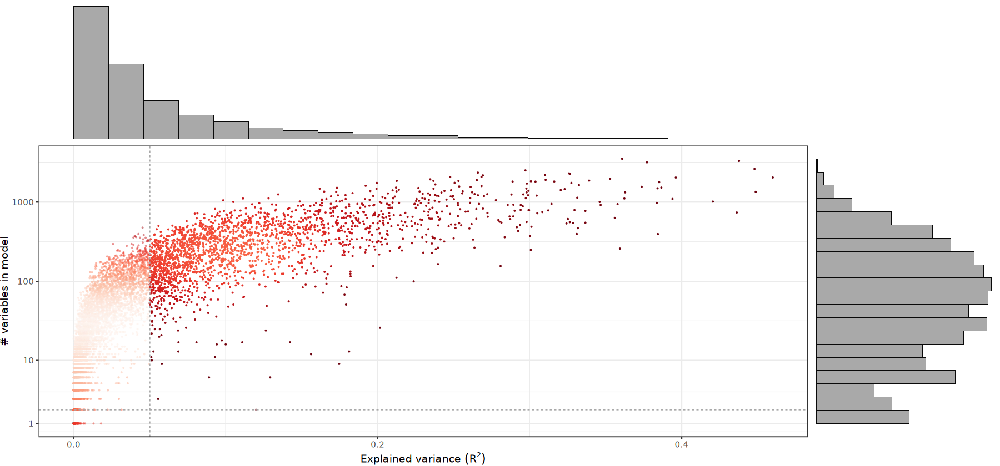

In [105]:
plot_gof(object = Zhu_et_al_w_JOINT_eGRNs) # Check the goodness of fit plot for the inferred network.

In [106]:
Zhu_et_al_w_JOINT_eGRNs@data %>% levels()

[1] "0"  "1"  "2"  "3"  "4"  "5"  "6"  "7"  "8"  "9"  "10" "11" "12" "13" "14"
[16] "15" "16" "17" "18" "19" "20" "21" "22"

In [107]:
Zhu_seurat <- Zhu_et_al_w_JOINT_eGRNs@data

In [108]:
Zhu_seurat$cell_type %>% table()

.
                              endothelial cell 
                                           754 
                                     astrocyte 
                                          6245 
                               oligodendrocyte 
                                          5459 
                               microglial cell 
                                          4528 
        vascular associated smooth muscle cell 
                                           355 
                        inhibitory interneuron 
                                          3479 
                                      pericyte 
                                           677 
                          glutamatergic neuron 
                                         13146 
                             radial glial cell 
                                          1322 
                oligodendrocyte precursor cell 
                                          4896 
                        neural progeni

In [109]:
Zhu_seurat$author_cell_type %>% table()

.
      Astrocytes               EN   EN-fetal-early    EN-fetal-late 
            6245             4096             2573             6477 
     Endothelial           IN-CGE           IN-MGE         IN-fetal 
             754             1888             2386             3479 
             IPC        Microglia              OPC Oligodendrocytes 
             414             4528             4896             5459 
       Pericytes               RG             VSMC 
             677             1322              355 

In [110]:
Idents(Zhu_seurat) <- 'cell_type'

In [111]:
Zhu_seurat%>% levels()

[1] "endothelial cell"                              
 [2] "astrocyte"                                     
 [3] "oligodendrocyte"                               
 [4] "microglial cell"                               
 [5] "vascular associated smooth muscle cell"        
 [6] "inhibitory interneuron"                        
 [7] "pericyte"                                      
 [8] "glutamatergic neuron"                          
 [9] "radial glial cell"                             
[10] "oligodendrocyte precursor cell"                
[11] "neural progenitor cell"                        
[12] "medial ganglionic eminence derived interneuron"
[13] "caudal ganglionic eminence derived interneuron"

In [112]:
EC_detected_peaks_min5 <- 
    AccessiblePeaks(object = Zhu_seurat, assay = 'peaks', idents = 'endothelial cell', min.cells = 5)

In [113]:
EC_detected_peaks_min5 %>% length

[1] 46362

In [114]:
EC_eGRN_min5 <- Zhu_et_al_w_JOINT_eGRNs

In [115]:
EC_eGRN_min5@grn@networks$glm_network@coefs <- 
                EC_eGRN_min5@grn@networks$glm_network@coefs %>% 
                            filter(region %in% EC_detected_peaks_min5)

In [116]:
coef(EC_eGRN_min5) %>% dim()

[1] 2145   11

In [117]:
EC_eGRN_min5  <- find_modules(
    EC_eGRN_min5, 
    p_thresh = 0.1,
    nvar_thresh = 2, 
    min_genes_per_module = 1, 
    rsq_thresh = 0.05
)

Found 185 TF modules



In [118]:
EC_eGRN_min5@grn@networks$glm_network@modules

An Modules object with 69 TF modules

In [119]:
Zhu_et_al_w_JOINT_eGRNs %>% NetworkModules()

An Modules object with 448 TF modules

In [120]:
# Import network visualization functions:

source(here::here('r_scripts', 'network_visualization_functions_w_degree_option.r'))

make sure you installed the GGally, network, igraph and ggraph packages :)

First option: One can directly use only the node_names parameter to specify 
          the gene names to visualize in the graph

Second option: Use TF-names and/or target genes parameters 
         to visualize their connections

Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2


'network' 1.18.2 (2023-12-04), part of the Statnet Project
* 'news(package="network")' for changes since last version
* 'citation("network")' for citation information
* 'https://statnet.org' for help, support, and other information



Attaching package: 'igraph'


The following objects are masked from 'package:network':

    %c%, %s%, add.edges, add.vertices, delete.edges, delete.vertices,
    get.edge.attribute, get.edges, get.vertex.attribute, is.bipartite,
    is.directed, list.edge.attributes, list.vertex.attributes,
    set.edge.attribute, set.vertex.attribute


The following object is masked from 'p

In [121]:
options(repr.plot.width = 30, repr.plot.height = 24)

 Network attributes:
  vertices = 2406 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 80797 
    missing edges= 0 
    non-missing edges= 80797 

 Vertex attribute names: 
    vertex.names 

 Edge attribute names not shown 


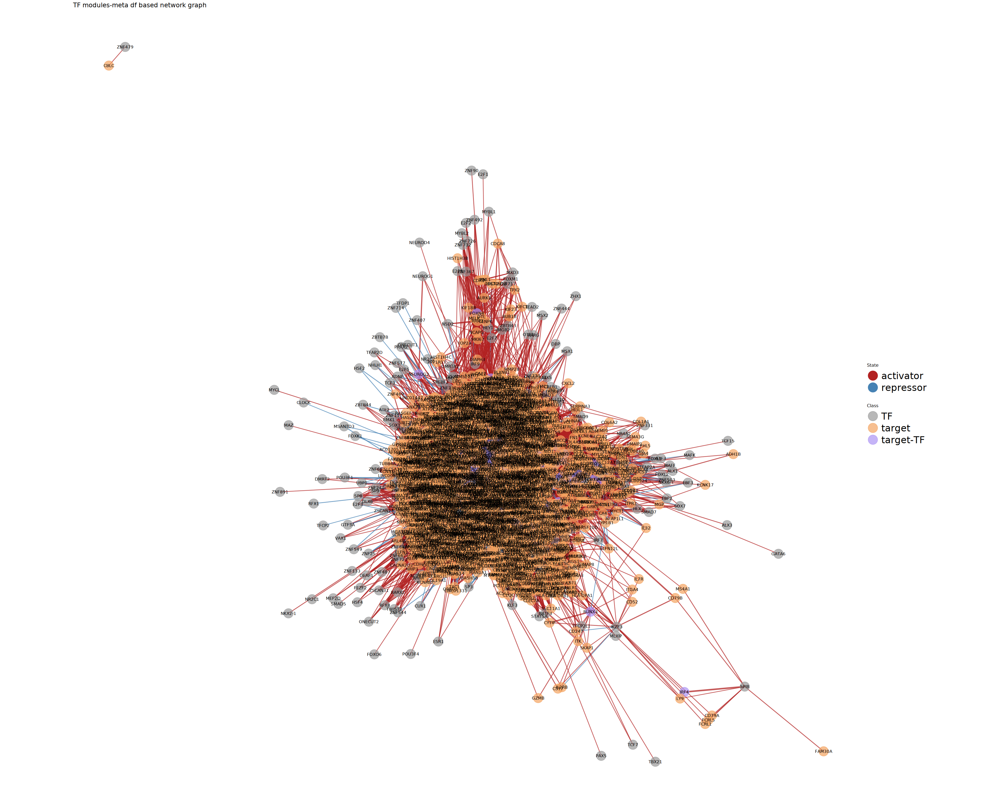

In [122]:
vis_network_w_GGNET2(meta_DF = NetworkModules(Zhu_et_al_w_JOINT_eGRNs)@meta)

 Network attributes:
  vertices = 330 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 379 
    missing edges= 0 
    non-missing edges= 379 

 Vertex attribute names: 
    vertex.names 

No edge attributes


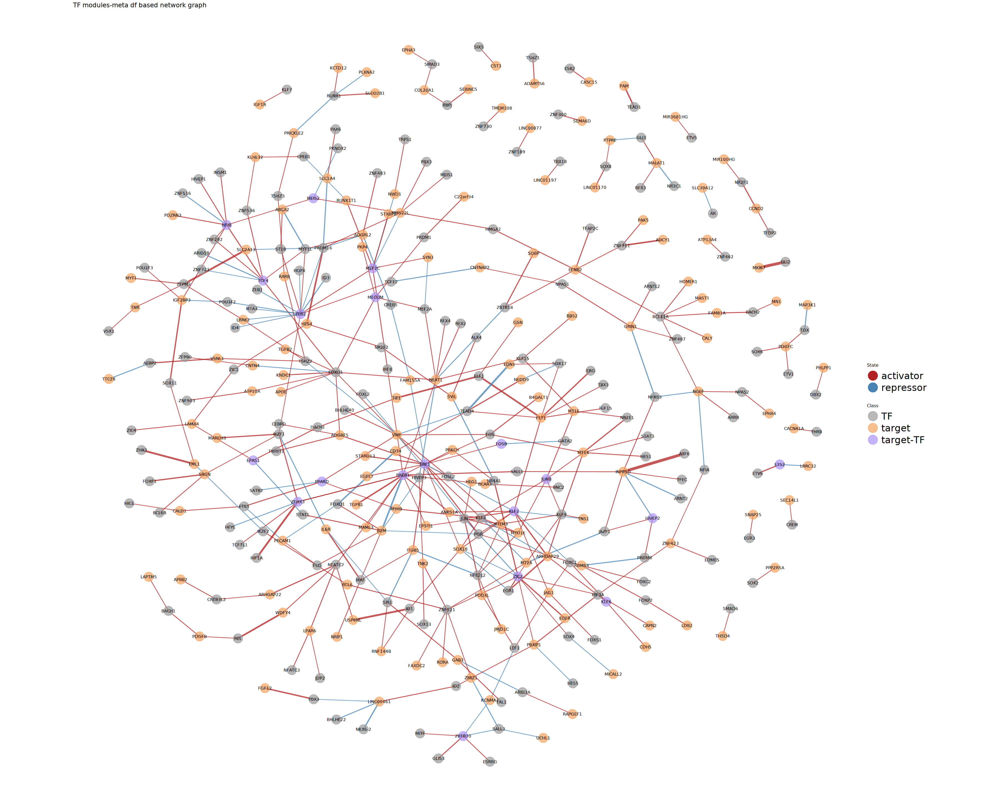

In [123]:
vis_network_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min5)@meta)

In [124]:
obj_dir <- '/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2023_Zhu_et_al/Zhu_et_al_2023/24_09_24'

G_Bonilla_et_al_DE_data_sig_EC <- readRDS(file.path(obj_dir, 'r_objects', 'DE_data_sig_EC.RDS'))

In [125]:
net_data_EC_min5 <- NetworkModules(EC_eGRN_min5)@meta %>% 
                        select(gene_name = target, feature = tf, weight = estimate)

In [126]:
G_Bonilla_et_al_DE_data_sig_EC %>% head()

,gene_name,value
,<chr>,<dbl>
Tmsb4x,TMSB4Y,1.041881
Flt1,FLT1,-1.139497
Adgrf5,ADGRF5,-1.479323
Spock2,SPOCK2,-1.337619
Abcb1a,ABCB1,-1.401405
Ifitm3,IFITM3,1.398468


In [127]:
# Run GRaNPA to generate the RF models:

res_EC_min5 <- GRaNPA::GRaNPA_Analysis(gene_metric_data = G_Bonilla_et_al_DE_data_sig_EC, 
                                       GRN_matrix = net_data_EC_min5)

Loading required package: futile.logger

Loading required package: caret

Loading required package: lattice


Attaching package: 'caret'


The following object is masked from 'package:purrr':

    lift




INFO [2025-03-20 20:02:29] GRaNPA version 2, predicting gene-specific values based on network data and reporting important transcription factors that can explain variations. Ensure input data is pre-filtered.
INFO [2025-03-20 20:02:29] Start of applying learning model
INFO [2025-03-20 20:02:29] number of features: 52
INFO [2025-03-20 20:02:29] number of Genes: 26


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
"There were missing values in resampled performance measures."


INFO [2025-03-20 20:02:31] Start of applying learning model
INFO [2025-03-20 20:02:31] number of features: 52
INFO [2025-03-20 20:02:31] number of Genes: 26


Warning message in nominalTrainWorkflow(x = x, y = y, wts = weights, info = trainInfo, :
"There were missing values in resampled performance measures."


In [128]:
p1 <- GRaNPA::plot_GRaNPA_result(res = res_EC_min5$result) + 
                                ggtitle(label = 'accessible_regions_min_5_cells')

Loading required package: cowplot


Attaching package: 'cowplot'


The following object is masked from 'package:lubridate':

    stamp




In [129]:
p1.2 <- GRaNPA::plot_important_features(model = res_EC_min5$models$Real, n = 20) +
                                ggtitle(label = 'accessible_regions_min_5_cells')

In [130]:
options(repr.plot.width = 10, repr.plot.height = 10)

Warning message:
"Removed 2 rows containing missing values or values outside the scale range
(`geom_bar()`)."


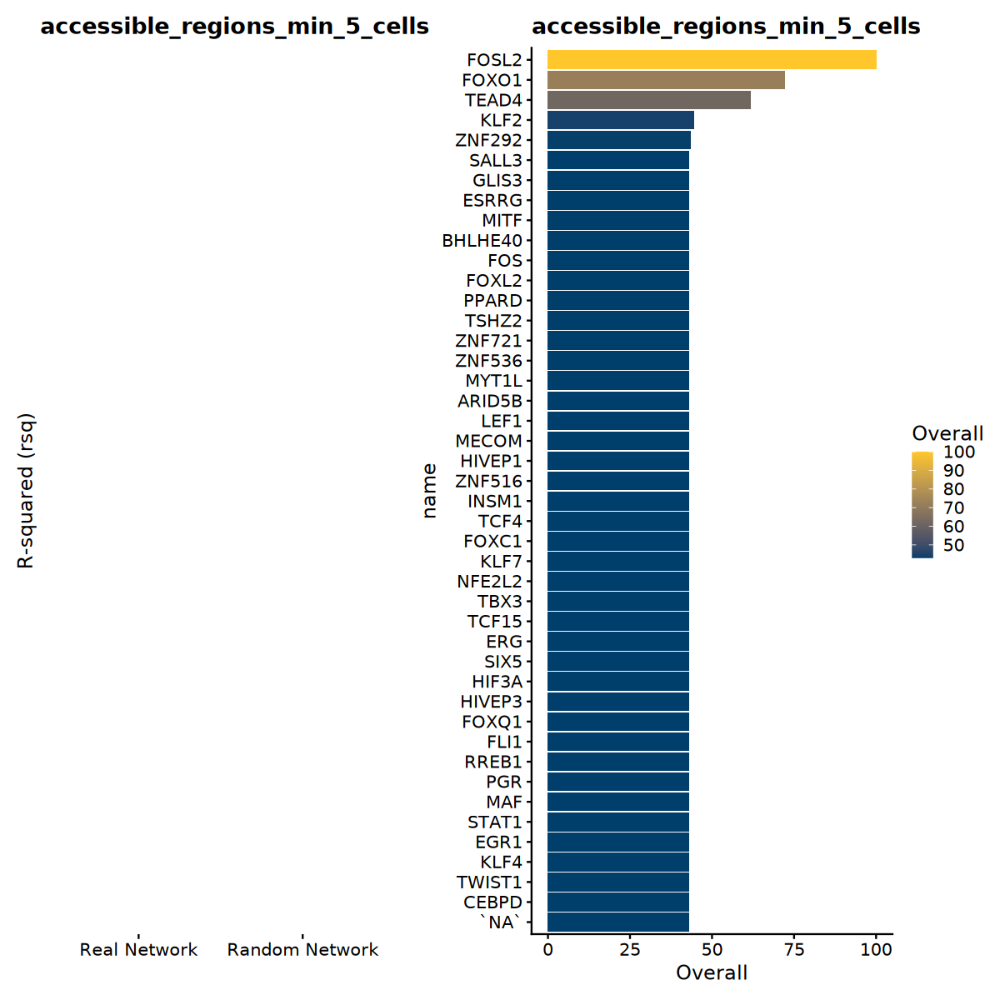

In [131]:
p1 + p1.2

In [132]:
res_EC_min5$result

rsq,ngenes,random
<dbl>,<int>,<lgl>
NA,26,FALSE
NA,26,TRUE


In [133]:
# Just to see the impact of network size on Random Forest model:

net_data_ALL <- NetworkModules(Zhu_et_al_w_JOINT_eGRNs)@meta %>% 
                        select(gene_name = target, feature = tf, weight = estimate)

In [134]:
# Run GRaNPA to generate the RF models:

res_ALL <- GRaNPA::GRaNPA_Analysis(gene_metric_data = G_Bonilla_et_al_DE_data_sig_EC, 
                                       GRN_matrix = net_data_ALL)

INFO [2025-03-20 20:03:45] GRaNPA version 2, predicting gene-specific values based on network data and reporting important transcription factors that can explain variations. Ensure input data is pre-filtered.
INFO [2025-03-20 20:03:45] Start of applying learning model
INFO [2025-03-20 20:03:45] number of features: 369
INFO [2025-03-20 20:03:45] number of Genes: 159
INFO [2025-03-20 20:04:10] Start of applying learning model
INFO [2025-03-20 20:04:10] number of features: 369
INFO [2025-03-20 20:04:10] number of Genes: 159


In [135]:
p1 <- GRaNPA::plot_GRaNPA_result(res = res_ALL$result) + 
                                ggtitle(label = 'ALL_cell_types')

In [136]:
p1.2 <- GRaNPA::plot_important_features(model = res_ALL$models$Real, n = 20) +
                                ggtitle(label = 'ALL_cell_types')

In [137]:
options(repr.plot.width = 10, repr.plot.height = 10)

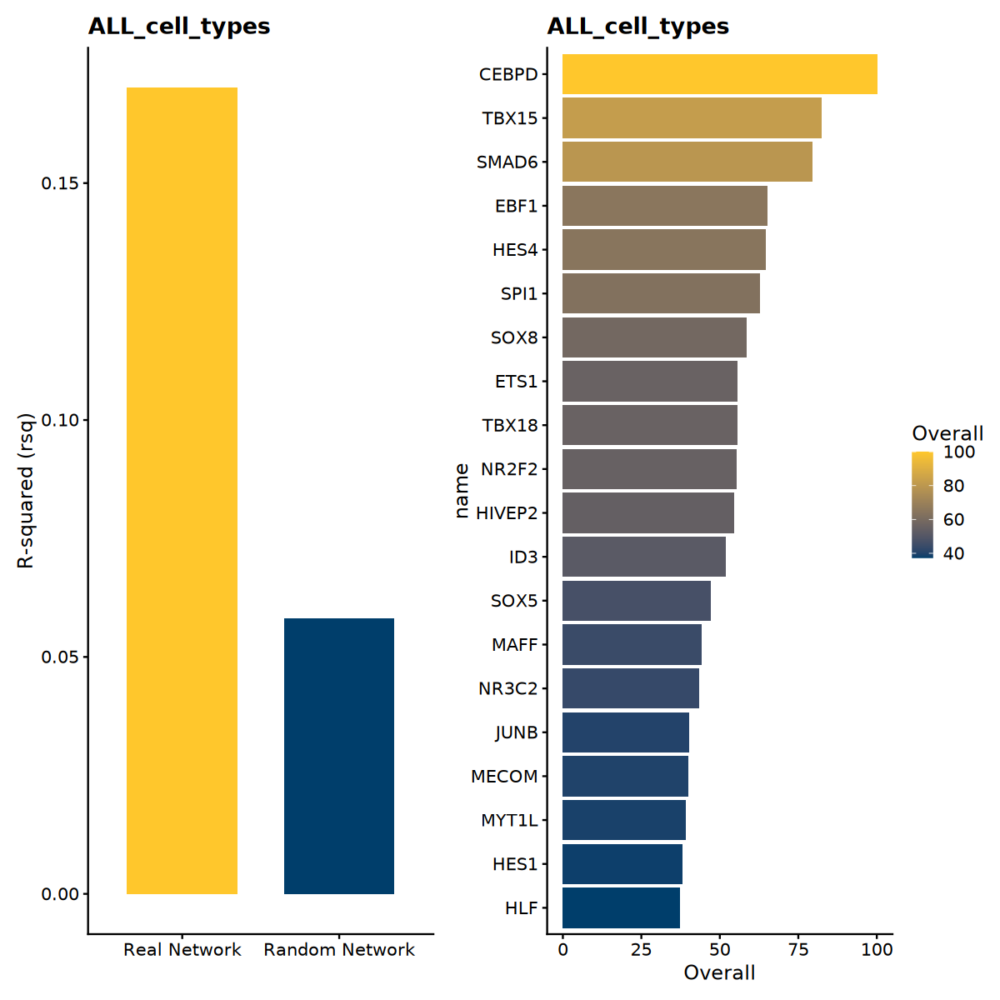

In [138]:
p1 + p1.2

In [140]:
# I will try using min cells 1 to select EC accessible regions:

In [141]:
EC_detected_peaks_min1 <- 
    AccessiblePeaks(object = Zhu_seurat, assay = 'peaks', idents = 'endothelial cell', min.cells = 1)

In [142]:
EC_detected_peaks_min1 %>% length

[1] 144345

In [143]:
EC_eGRN_min1 <- Zhu_et_al_w_JOINT_eGRNs

In [144]:
EC_eGRN_min1@grn@networks$glm_network@coefs <- 
                EC_eGRN_min1@grn@networks$glm_network@coefs %>% 
                            filter(region %in% EC_detected_peaks_min1)

In [145]:
coef(EC_eGRN_min1) %>% dim()

[1] 11346    11

In [146]:
EC_eGRN_min1  <- find_modules(
    EC_eGRN_min1, 
    p_thresh = 0.1,
    nvar_thresh = 2, 
    min_genes_per_module = 1, 
    rsq_thresh = 0.05
)

Found 308 TF modules



In [147]:
EC_eGRN_min1@grn@networks$glm_network@modules

An Modules object with 200 TF modules

In [148]:
Zhu_et_al_w_JOINT_eGRNs %>% NetworkModules()

An Modules object with 448 TF modules

In [149]:
# Import network visualization functions:

source(here::here('r_scripts', 'network_visualization_functions_w_degree_option.r'))

make sure you installed the GGally, network, igraph and ggraph packages :)

First option: One can directly use only the node_names parameter to specify 
          the gene names to visualize in the graph

Second option: Use TF-names and/or target genes parameters 
         to visualize their connections

make sure you installed the GGally, network, igraph and ggraph packages :)

First option: One can directly use only the node_names parameter to specify 
          the gene names to visualize in the graph

Second option: Use TF-names and/or target genes parameters 
         to visualize their connections



In [150]:
options(repr.plot.width = 30, repr.plot.height = 24)

 Network attributes:
  vertices = 907 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 1608 
    missing edges= 0 
    non-missing edges= 1608 

 Vertex attribute names: 
    vertex.names 

 Edge attribute names not shown 


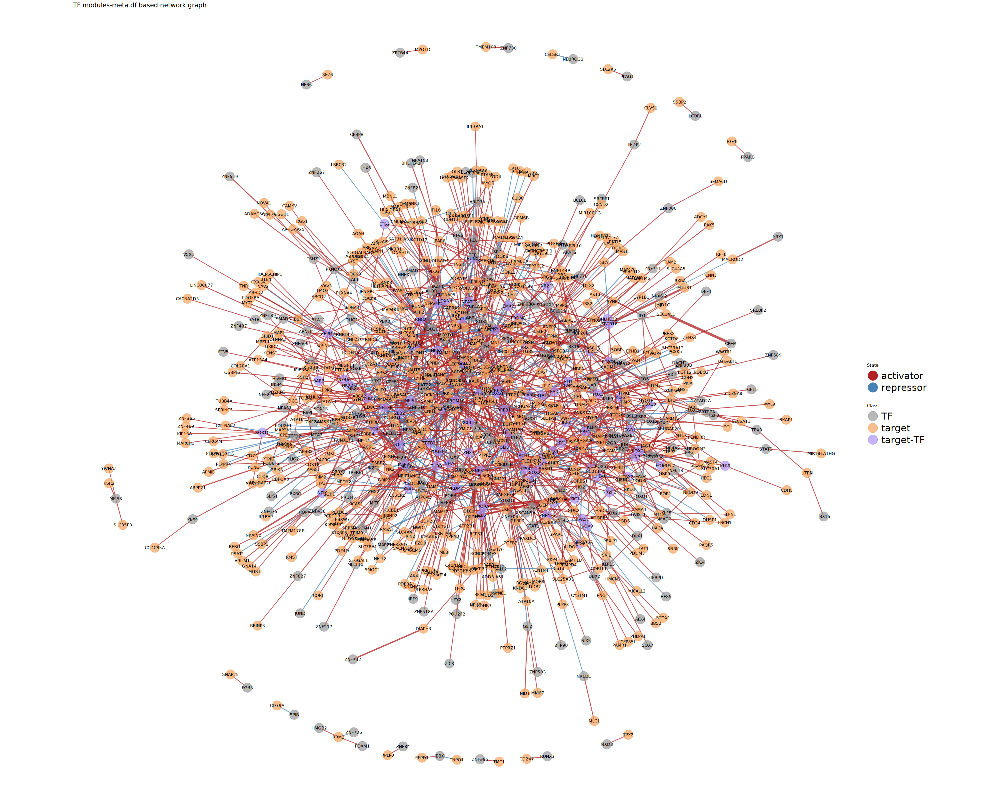

In [151]:
vis_network_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min1)@meta)

In [152]:
net_data_EC_min1 <- NetworkModules(EC_eGRN_min1)@meta %>% 
                        select(gene_name = target, feature = tf, weight = estimate)

In [153]:
G_Bonilla_et_al_DE_data_sig_EC %>% head()

,gene_name,value
,<chr>,<dbl>
Tmsb4x,TMSB4Y,1.041881
Flt1,FLT1,-1.139497
Adgrf5,ADGRF5,-1.479323
Spock2,SPOCK2,-1.337619
Abcb1a,ABCB1,-1.401405
Ifitm3,IFITM3,1.398468


In [154]:
# Run GRaNPA to generate the RF models:

res_EC_min1 <- GRaNPA::GRaNPA_Analysis(gene_metric_data = G_Bonilla_et_al_DE_data_sig_EC, 
                                       GRN_matrix = net_data_EC_min1)

INFO [2025-03-20 20:08:10] GRaNPA version 2, predicting gene-specific values based on network data and reporting important transcription factors that can explain variations. Ensure input data is pre-filtered.
INFO [2025-03-20 20:08:10] Start of applying learning model
INFO [2025-03-20 20:08:10] number of features: 110
INFO [2025-03-20 20:08:10] number of Genes: 65
INFO [2025-03-20 20:08:16] Start of applying learning model
INFO [2025-03-20 20:08:16] number of features: 110
INFO [2025-03-20 20:08:16] number of Genes: 65


In [155]:
p1 <- GRaNPA::plot_GRaNPA_result(res = res_EC_min1$result) + 
                                ggtitle(label = 'accessible_regions_min_1_cells')

In [156]:
p1.2 <- GRaNPA::plot_important_features(model = res_EC_min1$models$Real, n = 20) +
                                ggtitle(label = 'accessible_regions_min_1_cells')

In [157]:
options(repr.plot.width = 10, repr.plot.height = 10)

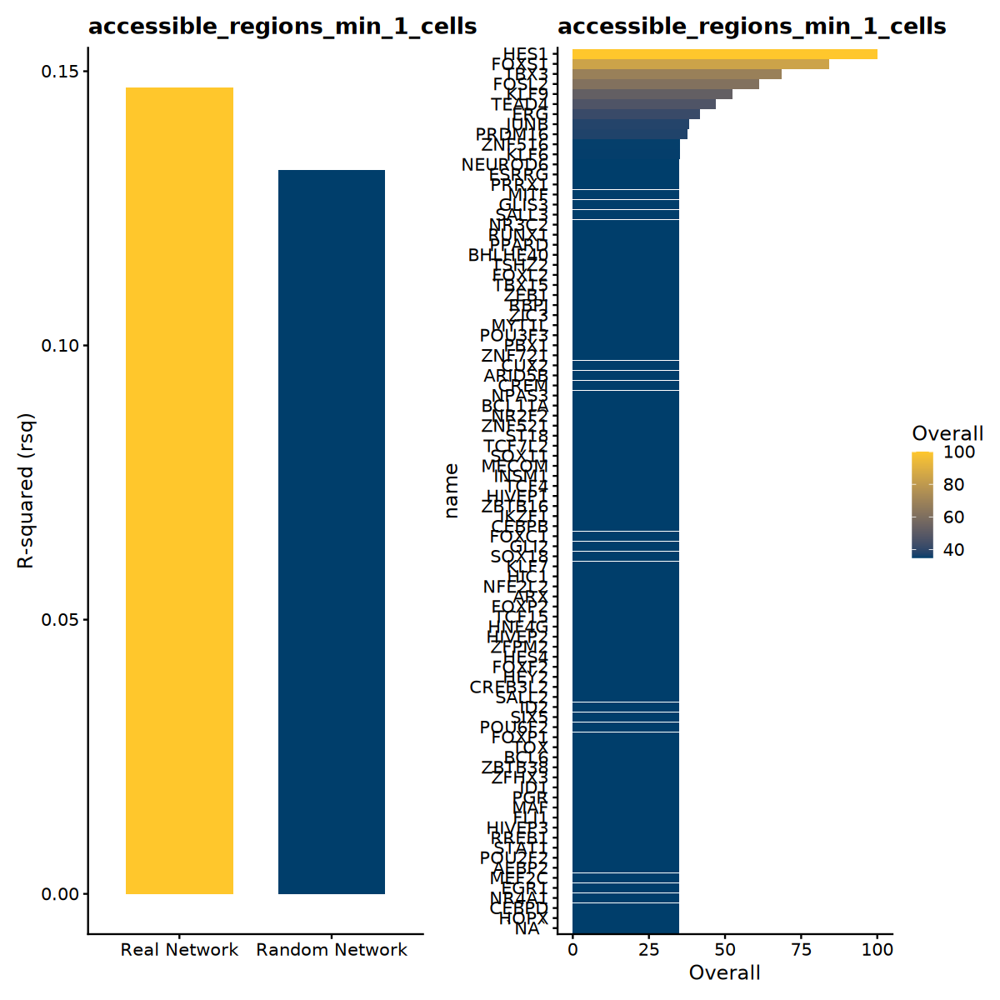

In [158]:
p1 + p1.2

In [159]:
res_EC_min1$result

rsq,ngenes,random
<dbl>,<int>,<lgl>
0.1469280,65,FALSE
0.1318591,65,TRUE


In [139]:
# Generate EC plots again:

In [123]:
options(repr.plot.width = 30, repr.plot.height = 24)

In [160]:
p1_EC <- GRaNPA::plot_GRaNPA_result(res = res_EC_min1$result) + 
                                ggtitle(label = 'accessible_regions_min_1_cells')

In [161]:
p1.2_EC <- GRaNPA::plot_important_features(model = res_EC_min1$models$Real, n = 20) +
                                ggtitle(label = 'accessible_regions_min_1_cells')

In [162]:
options(repr.plot.width = 10, repr.plot.height = 10)

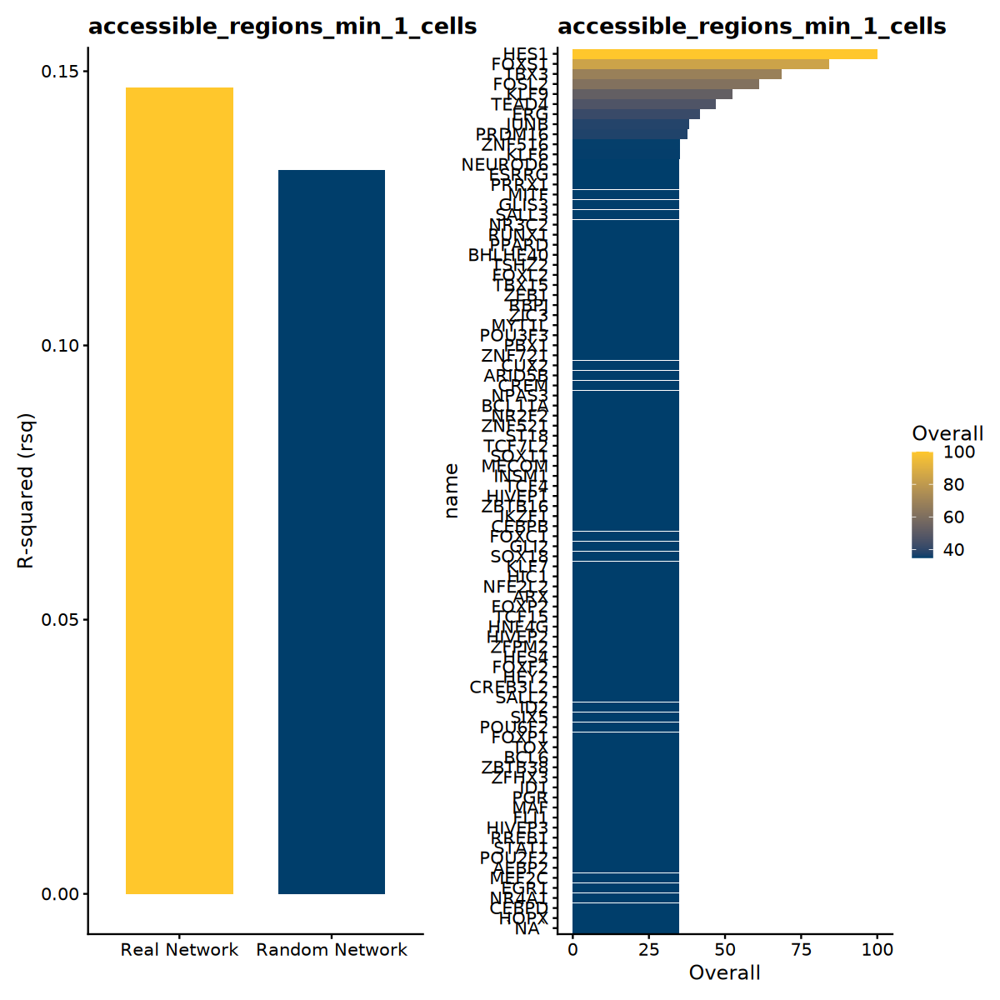

In [163]:
p1_EC + p1.2_EC

In [164]:
G_Bonilla_et_al_DE_data_sig_EC %>% head()

,gene_name,value
,<chr>,<dbl>
Tmsb4x,TMSB4Y,1.041881
Flt1,FLT1,-1.139497
Adgrf5,ADGRF5,-1.479323
Spock2,SPOCK2,-1.337619
Abcb1a,ABCB1,-1.401405
Ifitm3,IFITM3,1.398468


In [165]:
p1.2_EC$data %>% arrange(desc(Overall))

,Overall,name
,<dbl>,<fct>
HES1,100.00000,HES1
FOXS1,84.12723,FOXS1
TBX3,68.32592,TBX3
FOSL2,61.11898,FOSL2
KLF9,52.30932,KLF9
TEAD4,46.89395,TEAD4
ERG,41.75180,ERG
JUNB,38.13682,JUNB
PRDM16,37.56616,PRDM16


In [166]:
options(repr.plot.width = 30, repr.plot.height = 24)

 Network attributes:
  vertices = 7 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 6 
    missing edges= 0 
    non-missing edges= 6 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


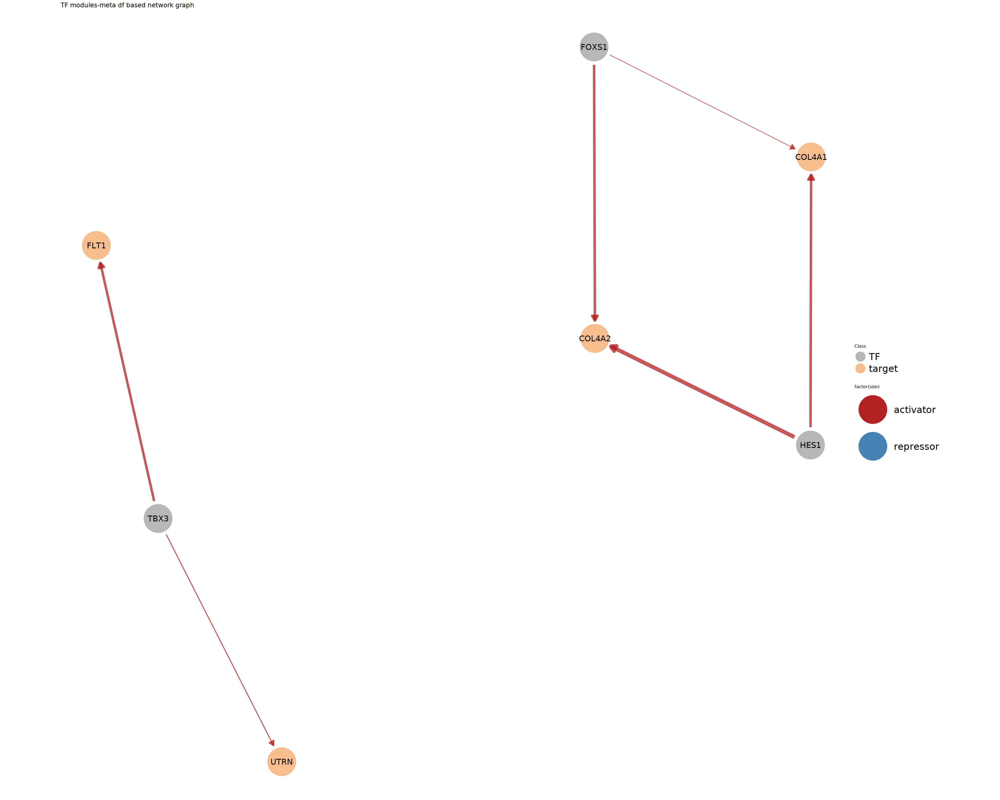

In [167]:
# or using another ggnet2 function with default subnetwork parameters:

vis_network_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min1)@meta,
                         subnetwork_default_node_and_label_size =  TRUE,
                         target_genes = G_Bonilla_et_al_DE_data_sig_EC$gene_name, 
                         TF_names = as.character(p1.2_EC$data %>% arrange(desc(Overall)) %>% pull(name))[1:3], 
                         arrow = TRUE)

In [168]:
options(repr.plot.width = 28, repr.plot.height = 7)

In [170]:
# Expression levels of important TFs in the endothelial cells:

p1 <- scCustomize::DotPlot_scCustom(seurat_object = Zhu_seurat, 
                              group.by = 'cell_type',
                              colors_use = scCustomize::viridis_plasma_dark_high,
                              x_lab_rotate = TRUE, 
                              features = as.character(p1.2_EC$data %>% arrange(desc(Overall)) %>% pull(name))) +
                              ggtitle(label = 'Expression levels of important TFs across cell types') +
                              theme(plot.title = element_text(hjust = 0.5),  plot.margin = unit(c(1, 1, 1, 1), "cm")) # adjust the left margin

Warning message:
"The following features were omitted as they were not found:
i `NA`"


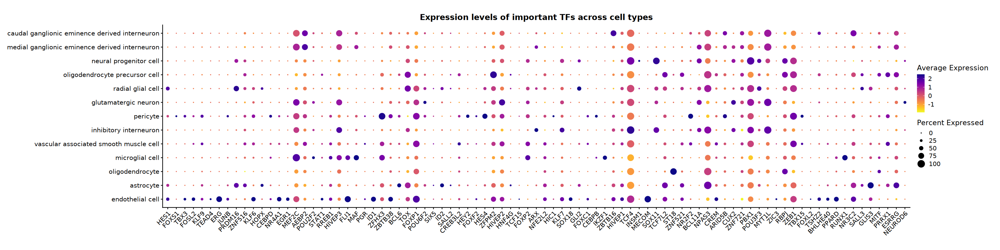

In [171]:
options(repr.plot.width = 28, repr.plot.height = 7)

p1

In [172]:
# Genes that are present both in network and differentially expressed gene list:

intersect(union(NetworkModules(EC_eGRN_min1)@meta$target, NetworkModules(EC_eGRN_min1)@meta$tf), G_Bonilla_et_al_DE_data_sig_EC$gene_name) %>% length

[1] 82

In [173]:
overlapping_DE_genes <-
    intersect(union(NetworkModules(EC_eGRN_min1)@meta$target, NetworkModules(EC_eGRN_min1)@meta$tf), G_Bonilla_et_al_DE_data_sig_EC$gene_name)

In [174]:
chunks <- seq(from = 1, to = length(overlapping_DE_genes), by = 50)

In [175]:
# Initialize an empty list to store plots
plot_list <- vector(mode = 'list', length = length(chunks))

# Loop through 'chunks' correctly
for (k in seq_along(chunks)) {
    
    # Get current index
    i <- chunks[k]
    
    # Define upper bound correctly
    if ( (length(overlapping_DE_genes) - i) < 50 ) {
        upper_bound <- max(0, length(overlapping_DE_genes) - i)  # Prevent negative values
    } else {
        upper_bound <- 49
    }
    
    # Generate the plot and store it in the list
    plot_list[[k]] <- scCustomize::DotPlot_scCustom(
        seurat_object = Zhu_seurat, 
        group.by = 'cell_type',
        colors_use = scCustomize::viridis_plasma_dark_high,
        x_lab_rotate = TRUE, 
        features = overlapping_DE_genes[i:(i + upper_bound)]
    ) +
    ggtitle(label = glue::glue('Expression levels of overlapping mouse_stroke_DE genes across cell types: PART {k}')) +
    theme(plot.title = element_text(hjust = 0.5), plot.margin = unit(c(1, 1, 1, 1), "cm"))
}

In [176]:
my_theme <- ggplot2::theme(
    axis.title.x = ggplot2::element_text(size = 14),  # X-axis title size
    axis.title.y = ggplot2::element_text(size = 14),  # Y-axis title size
    axis.text.x  = ggplot2::element_text(size = 14, angle = 45, hjust = 1),  # X-axis tick labels
    axis.text.y  = ggplot2::element_text(size = 14),  # Y-axis tick labels
    legend.text  = ggplot2::element_text(size = 15)   # Legend text size
)

my_margin <- ggplot2::theme(plot.margin = ggplot2::unit(c(1, 1, 1, 1), "cm"))  # Add margin to top, right, bottom, and left margins, respectively.

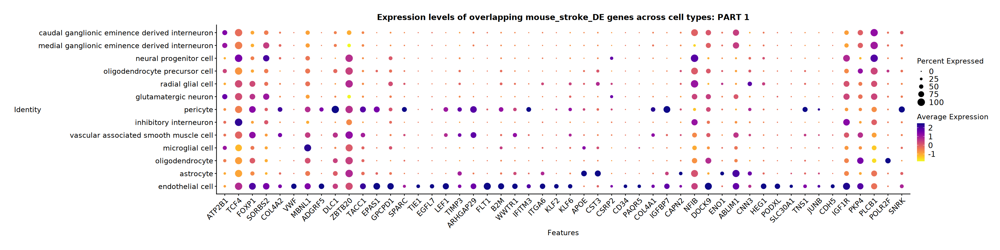

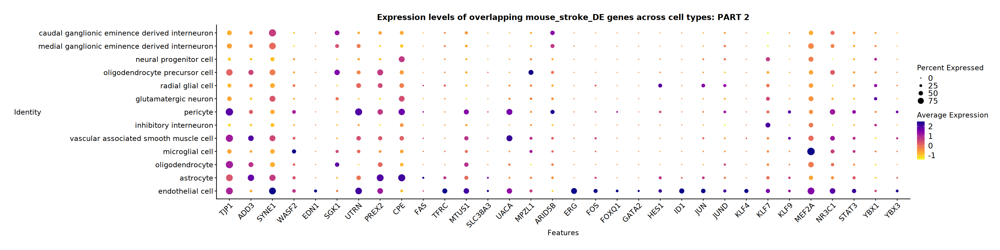

In [177]:
for(each_plot in plot_list) {

    print(each_plot + my_theme)

}

In [178]:
# Compare all-cell types aggregated eGRNs and endothelial-peak regions subsetted networks-trained models:

In [179]:
p1.1_ALL <- GRaNPA::plot_GRaNPA_result(res = res_ALL$result) + 
                                ggtitle(label = 'all_regions_in_all_cell_types')

In [180]:
p1.2_ALL <- GRaNPA::plot_important_features(model = res_ALL$models$Real, n = 20) +
                                ggtitle(label = 'ALL_cell_types')

In [181]:
options(repr.plot.width = 10, repr.plot.height = 10)

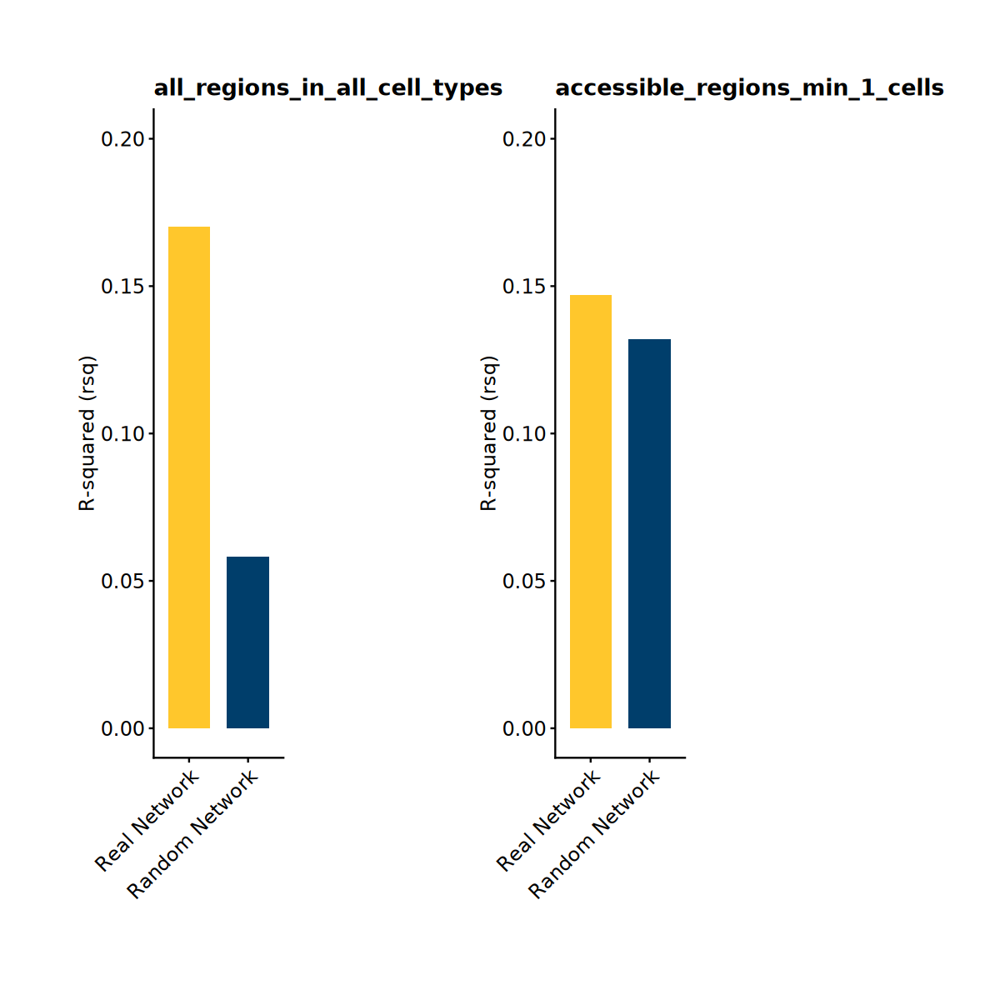

In [183]:
p1.1_ALL + p1_EC  & coord_cartesian(ylim = c(0, 0.2)) & my_theme & ggplot2::theme(plot.margin = ggplot2::unit(c(1, 4, 1, 1), "cm"))

==================================================================================================

I combined all chunks of Pando eGRNs into a single one.\

Then, I found TF modules in this network object.\
In addition, I filtered in the network's coefficient data frame\
with the regions that are of non-zero counts in at least 1 or 5\
endothelial cells. Then, I found TF modules.\
After viewing networks, I trained Random Forest models\
with GRaNPA package to inspect the relationship between networks'\
connections and differentially expressed genes in mouse stroke\
endothelial cells. I generated plots of model metrics and\
important TFs.

Network with all accessible regions resulted in a better model,\
with higher r squared value compared to random network. However,\
important TFs from this model should be evaluated with a grain of\
salt, since not all of the peak regions in this network are accessible\
in the endothelial cells.

I also viewed endothelial network graph with top 3 important TFs, \
and target genes with differential expression in mouse stroke ECs.\


I also viewed the expression levels of top 20 important TFs predicted by\
RF model trained on endothelial network, across cell types. Also the\
expression levels of target genes with diff. expression in stroke mouse\
ECs.

Finally, I generated a plot that compares all and EC specific\
network-trained models along same scale of y-axes.

==================================================

I will think about how to use Epiregulon- and Pando-generated\
networks to identify TF-regulons with post-ischemia alteration\
potential in human brain ECs.

In [184]:
sessionInfo()

R version 4.4.2 (2024-10-31)
Platform: x86_64-unknown-linux-gnu
Running under: Red Hat Enterprise Linux 9.4 (Plow)

Matrix products: default
BLAS/LAPACK: /gnu/store/mj1kw87qd3m1q7r4844adkn5hifx8k6a-openblas-0.3.20/lib/libopenblasp-r0.3.20.so;  LAPACK version 3.9.0

locale:
 [1] LC_CTYPE=C          LC_NUMERIC=C        LC_TIME=C          
 [4] LC_COLLATE=C        LC_MONETARY=C       LC_MESSAGES=C.UTF-8
 [7] LC_PAPER=C          LC_NAME=C           LC_ADDRESS=C       
[10] LC_TELEPHONE=C      LC_MEASUREMENT=C    LC_IDENTIFICATION=C

time zone: Europe/Berlin
tzcode source: system (glibc)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] cowplot_1.1.3       caret_6.0-94        lattice_0.22-6     
 [4] futile.logger_1.4.3 ggraph_2.2.1        igraph_2.1.4       
 [7] network_1.18.2      GGally_2.2.1        Pando_1.1.1        
[10] Signac_1.14.0       Seurat_5.2.1        SeuratObject_5.0.2 
[13] sp_2.2-0            